### Classical Model: Forecast Stock Price at the end of the year 2020

### Imports and Settings

In [1]:
from datetime import date, datetime, timedelta
import glob
from itertools import product
import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd
from pathlib import Path
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import seaborn as sns
from tqdm import tqdm


# Time-Series Modeling packages
from pmdarima.arima import auto_arima

from sklearn.model_selection import train_test_split
from scipy import stats
import seaborn as sns
import statsmodels.api as sm
from statsmodels.tsa.arima_model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.statespace.sarimax import SARIMAXResults
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.seasonal import seasonal_decompose

import warnings
warnings.filterwarnings('ignore')




### Plot Settings

In [2]:
params = {'legend.fontsize': 'x-large',
          'figure.figsize': (15, 5),
         'axes.labelsize': 'x-large',
         'axes.titlesize':'x-large',
         'xtick.labelsize':'x-large',
         'ytick.labelsize':'x-large',
         'figure.dpi': 600}

plt.rcParams.update(params)

sns.set(rc={"figure.figsize": (30, 30), 
            "axes.titlesize" : 12, 
            "axes.labelsize" : 12, 
            "xtick.labelsize" : 14, 
            "ytick.labelsize" : 14 })


### Data Setting Variables

In [3]:
HISTORICAL_NASDAQ_PATH = Path('../assets/data/historical_NASDAQ')
TOP_PERFORMANT_STOCK_PATH = Path('../assets/data/processed_data/NASDAQ_stock_performance.csv')
START_DATE = date(2014, 1, 1)
END_DATE = date(2019, 12, 31)
TARGET_COL = 'Adj Close'
REQUIRED_COLS = ['Date', 'Adj Close']

In [4]:
top_10_performant_stock_symbols = pd.read_csv(TOP_PERFORMANT_STOCK_PATH)['stock_symbol'].tolist()
print(top_10_performant_stock_symbols)

['SEB', 'CABO', 'TPL', 'TTD', 'MELI', 'SHOP', 'MTD', 'ISRG', 'AZO', 'CSGP']


###  Helper Functions

In [5]:
# Date Parser
dateparser = lambda dates: pd.datetime.strptime(dates, '%Y-%m-%d')

In [6]:
# Get Data
def get_data(ticker_symbol, 
             data_folder_path = HISTORICAL_NASDAQ_PATH, 
             usecols = REQUIRED_COLS, 
             start_date = START_DATE, 
             end_date = END_DATE):
    '''
    Param(s):
        ticker_symbol: (str) stock ticker symbol
        data_folder_path: (str) path to historical stock data directory
        start_date: (date) 'YYYY-MM-DD'
        end_date: (date) 'YYYY-MM-DD'
    Return(s):
        dataframe between date-range
    '''
    # data file path
    file_path = Path(data_folder_path, f'{ticker_symbol}.csv')
    
    # import data
    df = pd.read_csv(file_path,
                     parse_dates = ['Date'],
                     index_col = 'Date',
                     usecols = usecols,
                     date_parser = dateparser)

    return df[start_date:end_date]

### Adj Close for top performant stocks

In [7]:
def combine_data(ticker_symbols):
    '''
    Param(s):
        ticker_sybmols: (list) list of stock symbols
    Return(s):
        dataframe containing Adjusted Close price of all the stocks in the list
    '''
    # Initialize Dataframe
    combined_df = pd.DataFrame()
    combined_df = get_data(ticker_symbols[0], 
                           data_folder_path = HISTORICAL_NASDAQ_PATH, 
                           usecols = REQUIRED_COLS, 
                           start_date = START_DATE, 
                           end_date = END_DATE)
    
    combined_df.rename(columns={'Adj Close': f'{ticker_symbols[0]}_adj_close'}, inplace=True)

    for ticker_symbol in tqdm(ticker_symbols):
        if ticker_symbol != ticker_symbols[0]:
            stock_df = get_data(ticker_symbol, 
                                          data_folder_path = HISTORICAL_NASDAQ_PATH, 
                                          usecols = REQUIRED_COLS, 
                                          start_date = START_DATE, 
                                          end_date = END_DATE)
            stock_df.rename(columns={'Adj Close': f'{ticker_symbol}_adj_close'}, inplace=True)
            

            # join
            combined_df = combined_df.join(stock_df, how='outer')
        
    return combined_df

In [8]:
combined_df = combine_data(ticker_symbols=top_10_performant_stock_symbols)

100%|██████████| 10/10 [00:00<00:00, 25.70it/s]


#### Plot stock price

In [9]:
def plot_stock_price(dataframe, ticker_symbols):
    '''
    Plots stock price for all the stock in the ticker_symbols list
    Param(s):
        dataframe: (dataframe) with adj. close price
        ticker_symbols: (list) list of stock symbols
    '''
    # Create figure
    fig = go.Figure()


    # Plot data
    for stock_symbol in ticker_symbols:
        date = dataframe.index.tolist()
        adj_close = dataframe[f'{stock_symbol}_adj_close'].tolist()

        # Add data
        fig.add_trace(
            go.Scatter(x=date, 
                       y=adj_close,
                       name=f'{stock_symbol}',

                       hoverinfo=f'name+x+y',
                      ))

    # Set title
    fig.update_layout(
        title_text="Adjusted Close Price for the Top 20 stocks."
    )

    # Set axis labels
    fig.update_layout(
        xaxis_title="Date",
        yaxis_title="Adjuste Close Price (USD)",
        font = dict(
            size=12
        )
    )


    # Add range slider
    fig.update_layout(
        xaxis=dict(
            rangeselector=dict(
                buttons=list([
                    dict(count=1,
                         label="1m",
                         step="month",
                         stepmode="backward"),
                    dict(count=6,
                         label="6m",
                         step="month",
                         stepmode="backward"),
                    dict(count=1,
                         label="YTD",
                         step="year",
                         stepmode="todate"),
                    dict(count=1,
                         label="1y",
                         step="year",
                         stepmode="backward"),
                    dict(step="all")
                ])
            ),
            rangeslider=dict(
                visible=True
            ),
            type="date"
        )
    )

    fig.show()

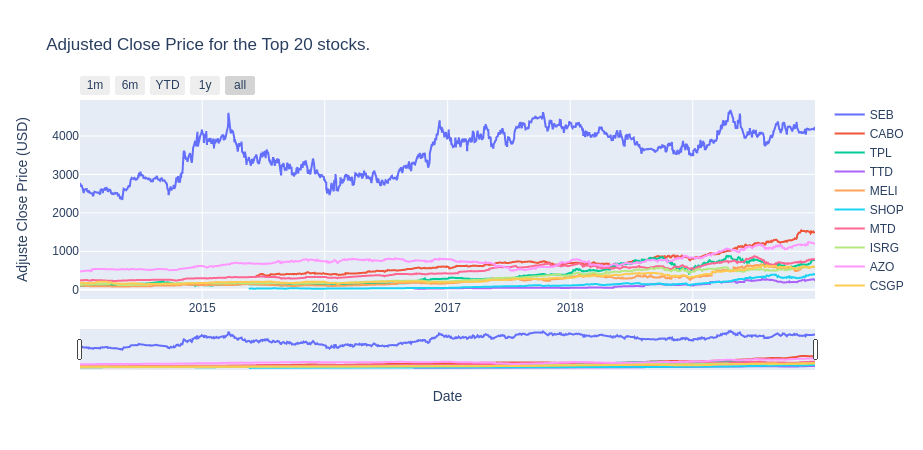

In [10]:
plot_stock_price(dataframe = combined_df, ticker_symbols = top_10_performant_stock_symbols)

### Characteristics of Time series data

#### **Decomposition of Time-Series data**:  

Time series data is composed of seasonality, trend and the residual (randomness). Let's decompose the time series and see its characteristics of each stock.

In [11]:
def plot_seasonality_decomp(dataframe, ticker_symbol, plot_title_note, model='additive', TARGET_COL = TARGET_COL):
    '''
    Plots seasonal components
    Param(s):
        dataframe: (dataframe) containing the TARGET_COL
        TARGET_COL: (str) column to decompose, example Adj. Close Price
        ticker_symbols: (list) list of stock symbols
    '''
    
    df_stock = dataframe[[f'{ticker_symbol}_adj_close']]
    df_stock_wk = df_stock.resample("W").mean()
    
    df_stock_wk.fillna(0, inplace=True)
    
    res = seasonal_decompose(df_stock_wk, model=model);
    
    fig, axes = plt.subplots(ncols=1, nrows=4, sharex=True, figsize=(20,8), dpi = 400)
    res.observed.plot(ax=axes[0], legend=False)
    
    # Title
    fig.text(0.5, 0.99, 
             f'Additive Seasonal Decomposition: {ticker_symbol} ({plot_title_note})',
             transform=fig.transFigure, 
             horizontalalignment='center',
             fontsize = 22)
    
    axes[0].set_ylabel('Observed',fontsize=20)
        
    res.trend.plot(ax=axes[1], legend=False)
    axes[1].set_ylabel('Trend', fontsize=20)
    
    res.seasonal.plot(ax=axes[2], legend=False)
    axes[2].set_ylabel('Seasonal', fontsize=20)
    
    res.resid.plot(ax=axes[3], legend=False)
    axes[3].set_ylabel('Residual', fontsize=20)
    

    plt.tight_layout()
    plt.show()

In [12]:
# ticker_symbol = 'CABO'
# plot_seasonality_decomp(dataframe = combined_df, 
#                         ticker_symbol = ticker_symbol, 
#                         plot_title_note = 'Weekly',
#                         model='additive', 
#                         TARGET_COL = f'{ticker_symbol}_adj_close')

SEB


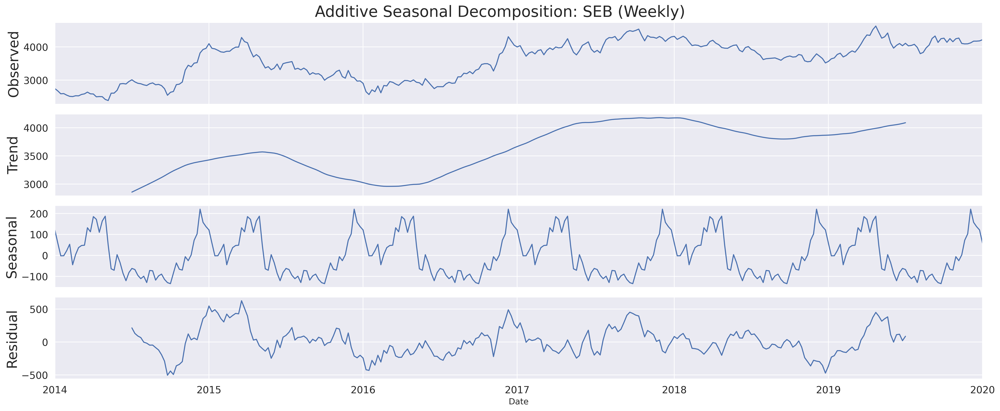

CABO


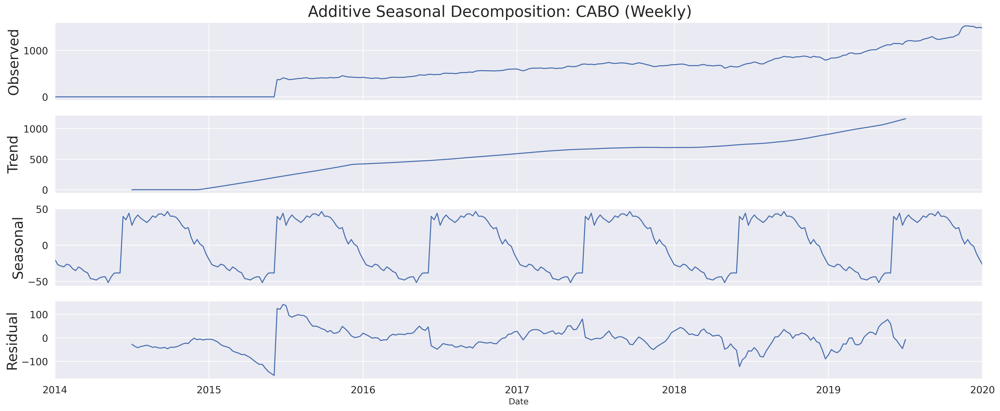

TPL


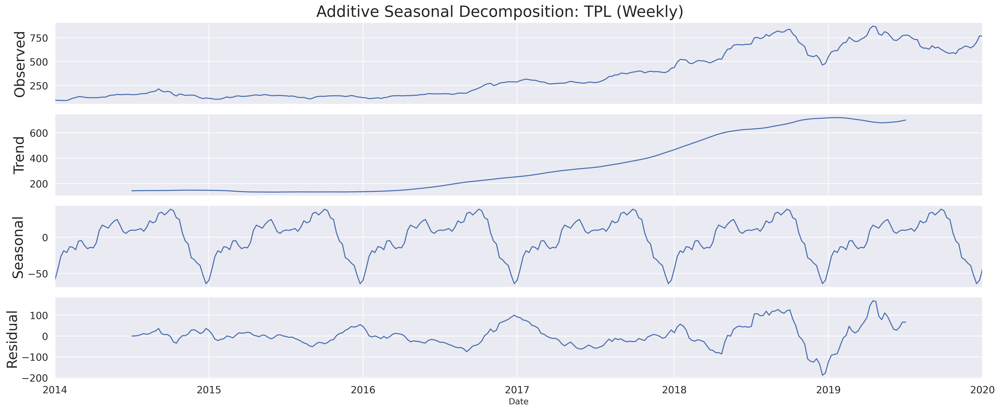

TTD


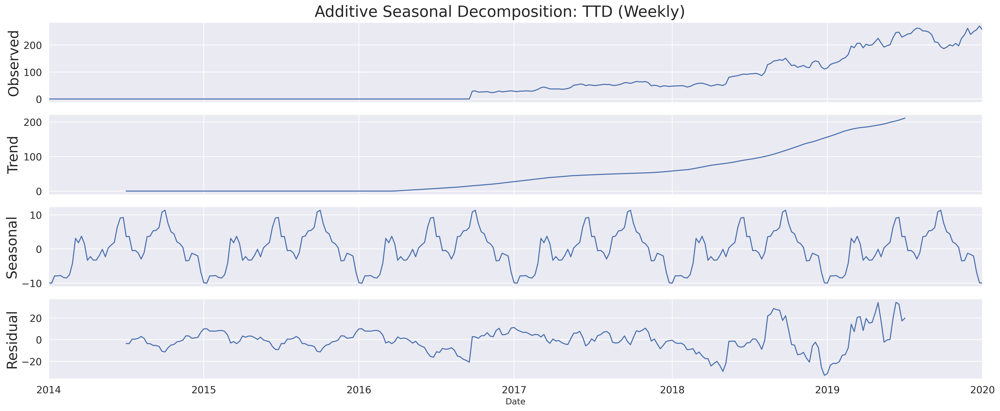

MELI


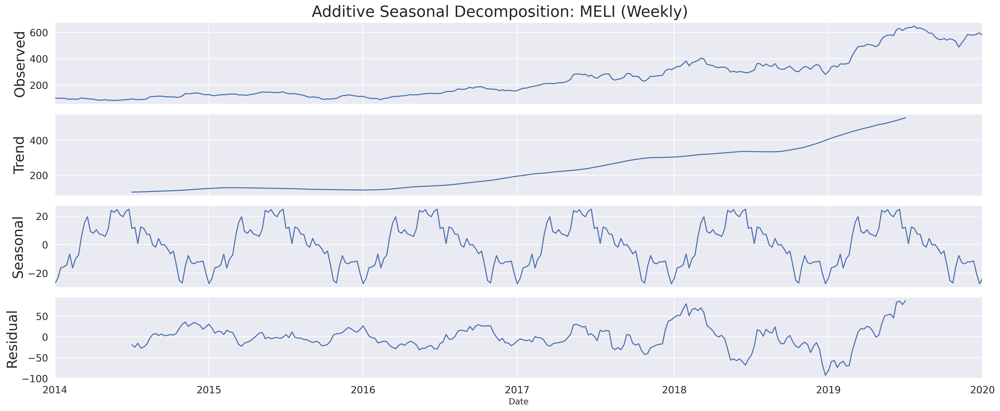

SHOP


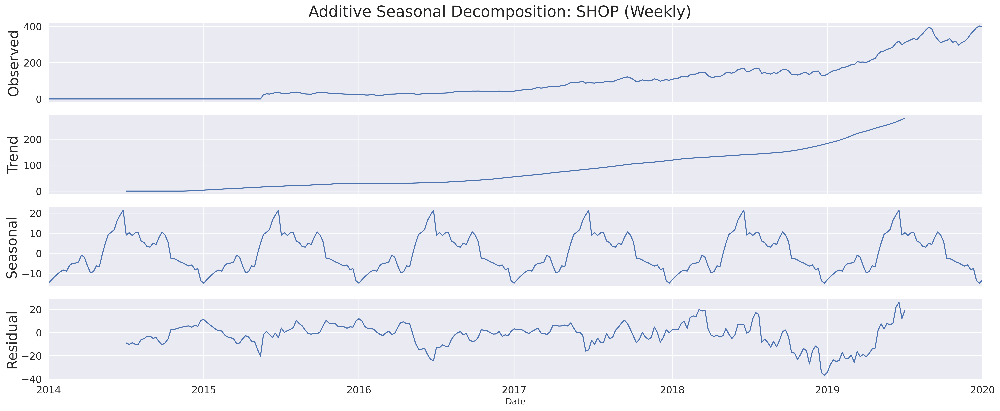

MTD


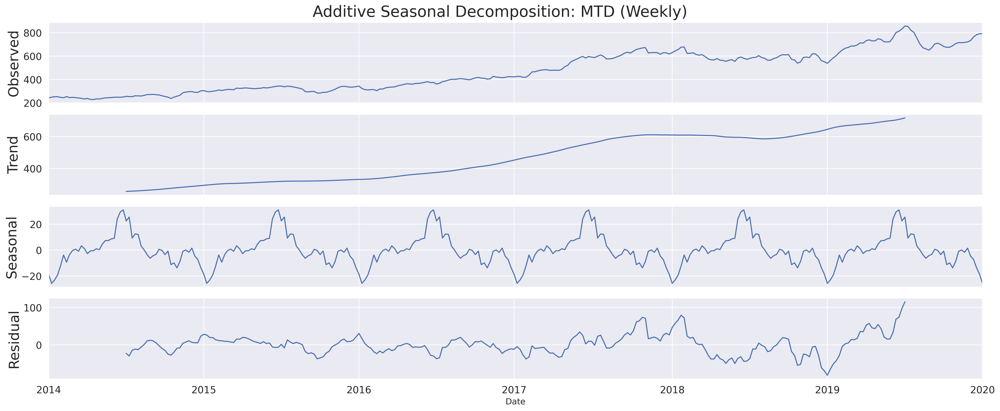

ISRG


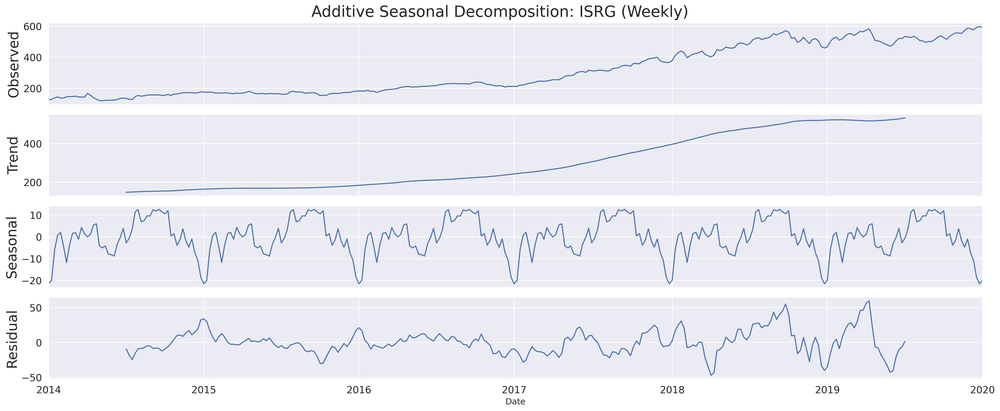

AZO


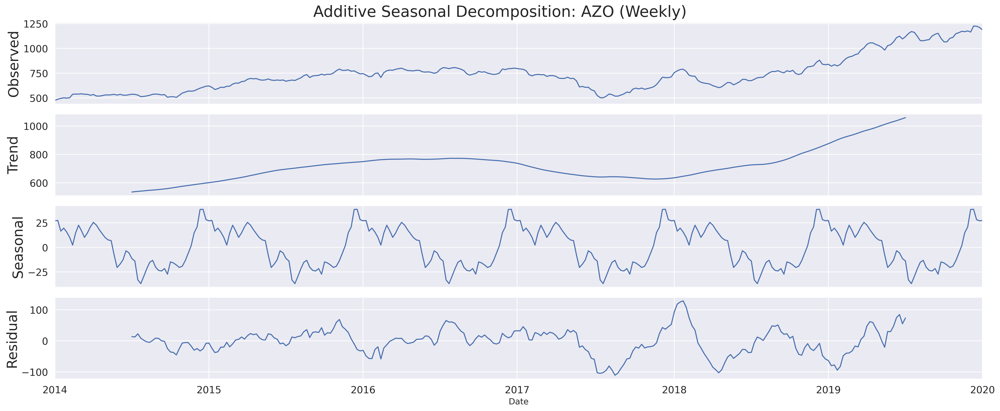

CSGP


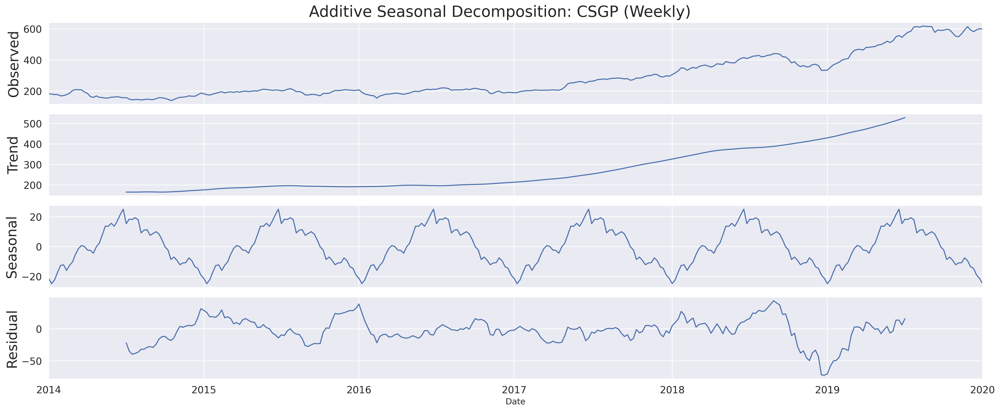

In [13]:
for ticker_symbol in top_10_performant_stock_symbols:
    print(ticker_symbol)
    plot_seasonality_decomp(dataframe = combined_df, 
                        ticker_symbol = ticker_symbol, 
                        plot_title_note = 'Weekly',
                        model='additive', 
                        TARGET_COL = f'{ticker_symbol}_adj_close')

### Augmented Dickey Fuller Test to Check Stationarity condtion

We also checked for stationarity of our data using the Augmented Dickey-Fuller test. ADF test is a commonly used statistical significance test to determine if the time series is stationary or not. It is a subcategory of a Unit Root Test. The presence of a Unit Root implies that the time-series is non-stationary. 

Null hypothesis in ADF Test is, $H_0$: $\alpha$ = 1
$$ \Delta Y_{t} = \alpha + \beta t +  \gamma Y_{t-1} + \delta_1 \Delta Y_{t-1} + \delta _2 \Delta Y_{t-2} + \cdots $$

where,   
$Y_t$, is the value of the time-series at time $t$  
$Y_{t-1}$, is the first lag term of time-series

Essentially, the ADF test uses a series of linear regressions of $\Delta y_t$ to regress against $t$ and $y_{t-1}$ and check the value of $\gamma$. If $\gamma = 0$, then we have a random walk process. However, if $-1 < 1 +\gamma < 1$, then we have a stationary series. In doing so we are checking the p-value for the series. When the p-value is less than 0.05, we reject the null hypothesis. In addition to determining the stationarity of the time series data, the ADF test also helps us determine the number of differencing operations we need to apply to obtain stationarity in non-stationary time-series data. 

In [14]:
# helper function
def adjust(val, length= 6): 
        return str(val).ljust(length)

def adfuller_test(series, autolag = 'BIC', signif=0.05, name='', verbose=False):
    '''
    Augented Dickey Fuller Test
    '''
    r = adfuller(series, autolag=autolag)
    output = {'test_statistic':round(r[0], 4), 
              'pvalue': round(r[1], 4), 
              'n_lags':round(r[2], 4), 
              'n_obs':r[3]}
    p_value = output['pvalue']    

    # Print Summary
    print(f'Augmented Dickey-Fuller Test:')
    print('----------------------------------------------------------')
    print(f'• Null Hypothesis: Data has unit root. Non-Stationary.')
    print(f'• Significance Level = {signif}')
    print(f'• Test Statistic = {output["test_statistic"]}')
    print(f'• No. Lags Chosen = {output["n_lags"]}')
    print('----------------------------------------------------------')

    for key,val in r[4].items():
        print(f' Critical value {adjust(key)} = {round(val, 3)}')

        if p_value <= signif:
            print(f"• P-Value = {p_value}. Rejecting Null Hypothesis.")
            print(f"• Series is Stationary.")

        else:
            print(f"• P-Value = {p_value}. Weak evidence to reject the Null Hypothesis.")
            print(f"• Series is Non-Stationary.")

In [15]:
# ADF test
for ticker_symbol in top_10_performant_stock_symbols:
    print(ticker_symbol)
    df_stock = combined_df[[f'{ticker_symbol}_adj_close']]
    df_stock.fillna(0, inplace=True)
    adfuller_test(df_stock, autolag = 'AIC')

SEB
Augmented Dickey-Fuller Test:
----------------------------------------------------------
• Null Hypothesis: Data has unit root. Non-Stationary.
• Significance Level = 0.05
• Test Statistic = -1.9655
• No. Lags Chosen = 5
----------------------------------------------------------
 Critical value 1%     = -3.435
• P-Value = 0.3019. Weak evidence to reject the Null Hypothesis.
• Series is Non-Stationary.
 Critical value 5%     = -2.863
• P-Value = 0.3019. Weak evidence to reject the Null Hypothesis.
• Series is Non-Stationary.
 Critical value 10%    = -2.568
• P-Value = 0.3019. Weak evidence to reject the Null Hypothesis.
• Series is Non-Stationary.
CABO
Augmented Dickey-Fuller Test:
----------------------------------------------------------
• Null Hypothesis: Data has unit root. Non-Stationary.
• Significance Level = 0.05
• Test Statistic = 0.7752
• No. Lags Chosen = 0
----------------------------------------------------------
 Critical value 1%     = -3.435
• P-Value = 0.9912. Weak 

> **Stationarity Check**:
> Using this **Augmented Dickey Fuller (ADF)** test we **do not** have sufficient statistically evidence to reject the null hypothesis for any of the stock time-series data, and prove that our data was stationary. Hence, we will use few techniques to mitigate this issue, namely:
>- box-cox transformation
>- differencing techniques (seasonal, n-order differencing)

#### Box-Cox Transformation ($\lambda$)
One of the common approach to suppress residual and achieve tend towards stationarity is by using Box-Cox transformation.

In [16]:
for ticker_symbol in top_10_performant_stock_symbols:
    if ticker_symbol not in ['CABO', 'TTD', 'MDB', 'SHOP', 'ARGX']:
        print(f'\nAfter Box-cox Transformation for {ticker_symbol}')
        df_stock = combined_df[[f'{ticker_symbol}_adj_close']]
        df_stock_wk = df_stock.resample("W").mean()
        df_stock_wk.fillna(0, inplace=True)
        pos_df_stock_wk =  df_stock_wk[f'{ticker_symbol}_adj_close'][df_stock_wk[f'{ticker_symbol}_adj_close'] > 0]
        df_stock_wk[f'{ticker_symbol}_adj_close_bc'], lmbda = stats.boxcox(pos_df_stock_wk)
        adfuller_test(df_stock_wk[f'{ticker_symbol}_adj_close_bc'], autolag = 'AIC')


After Box-cox Transformation for SEB
Augmented Dickey-Fuller Test:
----------------------------------------------------------
• Null Hypothesis: Data has unit root. Non-Stationary.
• Significance Level = 0.05
• Test Statistic = -1.9103
• No. Lags Chosen = 2
----------------------------------------------------------
 Critical value 1%     = -3.452
• P-Value = 0.3272. Weak evidence to reject the Null Hypothesis.
• Series is Non-Stationary.
 Critical value 5%     = -2.871
• P-Value = 0.3272. Weak evidence to reject the Null Hypothesis.
• Series is Non-Stationary.
 Critical value 10%    = -2.572
• P-Value = 0.3272. Weak evidence to reject the Null Hypothesis.
• Series is Non-Stationary.

After Box-cox Transformation for TPL
Augmented Dickey-Fuller Test:
----------------------------------------------------------
• Null Hypothesis: Data has unit root. Non-Stationary.
• Significance Level = 0.05
• Test Statistic = -0.4185
• No. Lags Chosen = 8
------------------------------------------------

> Box-Cox Transformation didn't completely remove the non-stationarity but help us move closer to rejecting our null-hypothesis. Let's see if second differencing will help us achieve stationarity.

#### Box-Cox Transformation ($\lambda$) + Second order differencing
* Second order differencing can be achieved by performing autoregression on the  previous time steps

In [17]:
for ticker_symbol in top_10_performant_stock_symbols:
    if ticker_symbol not in ['CABO', 'TTD', 'MDB', 'SHOP', 'ARGX']:
        print(f'\nAfter Box-cox Transformation for {ticker_symbol}')
        df_stock = combined_df[[f'{ticker_symbol}_adj_close']]
        df_stock_wk = df_stock.resample("W").mean()
        df_stock_wk.fillna(0, inplace=True)
        
        # Box-cox transformation
        pos_df_stock_wk =  df_stock_wk[f'{ticker_symbol}_adj_close'][df_stock_wk[f'{ticker_symbol}_adj_close'] > 0]
        df_stock_wk[f'{ticker_symbol}_adj_close_bc'], lmbda = stats.boxcox(pos_df_stock_wk)
        
        # 2nd order differencing
        df_stock_wk[f'{ticker_symbol}_adj_close_bc_2nd_diff'] = df_stock_wk[f'{ticker_symbol}_adj_close'] - df_stock_wk[f'{ticker_symbol}_adj_close_bc'].shift(1)
        adfuller_test(df_stock_wk[f'{ticker_symbol}_adj_close_bc_2nd_diff'][1:], autolag = 'AIC')


After Box-cox Transformation for SEB
Augmented Dickey-Fuller Test:
----------------------------------------------------------
• Null Hypothesis: Data has unit root. Non-Stationary.
• Significance Level = 0.05
• Test Statistic = -1.9329
• No. Lags Chosen = 2
----------------------------------------------------------
 Critical value 1%     = -3.452
• P-Value = 0.3167. Weak evidence to reject the Null Hypothesis.
• Series is Non-Stationary.
 Critical value 5%     = -2.871
• P-Value = 0.3167. Weak evidence to reject the Null Hypothesis.
• Series is Non-Stationary.
 Critical value 10%    = -2.572
• P-Value = 0.3167. Weak evidence to reject the Null Hypothesis.
• Series is Non-Stationary.

After Box-cox Transformation for TPL
Augmented Dickey-Fuller Test:
----------------------------------------------------------
• Null Hypothesis: Data has unit root. Non-Stationary.
• Significance Level = 0.05
• Test Statistic = -0.4446
• No. Lags Chosen = 8
------------------------------------------------

> Even after using Box-Cox transformations and $2^{nd}$ order differencing we failed to statistically rejected the Null hypothesis using ADF . This indicates that the stock values have seasonal characteristics associated with it. Which make sense, one obvious source of seasonality could be from periodic patterns related to quarterly reporting of the company.

### ARIMA V. SARIMA?
ARIMA model stands for Auto-regression Integrated Moving Average and SARIMA is Seasonal-ARIMA. Since, we failed to reject the stationarity in our stock price time-series data, we will be using SARIMA for forecasting. We can utilize statsmodel's  SARIMAX class to achieve this.  
**Note:** We only used Box-cox transformation since 2nd order differencing didn't remove seasonality

In [18]:
def SARIMAX_model(dataframe, ticker_symbol, col_req):
    model=SARIMAX(endog=dataframe[col_req],
              order=(0,1,0),
              seasonal_order=(0,0,1,6),
              trend='c',
              enforce_invertibility=False)
    results=model.fit()
    print(results.summary())

In [19]:
for ticker_symbol in top_10_performant_stock_symbols:
    df_stock = combined_df[[f'{ticker_symbol}_adj_close']]
    df_stock_wk = df_stock.resample("W").mean()
    df_stock_wk.fillna(0, inplace=True)

    
    if ticker_symbol not in ['CABO', 'TTD', 'MDB', 'SHOP', 'ARGX', 'TDG']:
        # Box-cox transformation
        pos_df_stock_wk =  df_stock_wk[f'{ticker_symbol}_adj_close'][df_stock_wk[f'{ticker_symbol}_adj_close'] > 0]
        df_stock_wk[f'{ticker_symbol}_adj_close_bc'], lmbda = stats.boxcox(pos_df_stock_wk)
                
        col_req = f'{ticker_symbol}_adj_close_bc'
    else:
        col_req = f'{ticker_symbol}_adj_close'

    SARIMAX_model(df_stock_wk, ticker_symbol, col_req)
    

                                      SARIMAX Results                                      
Dep. Variable:                    SEB_adj_close_bc   No. Observations:                  314
Model:             SARIMAX(0, 1, 0)x(0, 0, [1], 6)   Log Likelihood               -5098.113
Date:                             Sat, 14 Nov 2020   AIC                          10202.225
Time:                                     10:57:26   BIC                          10213.464
Sample:                                 01-05-2014   HQIC                         10206.716
                                      - 01-05-2020                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept   1.195e+05   1.57e+05      0.760      0.447   -1.89e+05    4.28e+05
ma.S.L6       -0.0455      

> Note the warning here is due to the non invertibility of the matrix in the regression algorithm. 

### SARIMA Hyper-parameter tuning

As a quick overview, SARIMA models are ARIMA models with a seasonal component. 

Per the formula **SARIMA(p,d,q)(P,D,Q,s)**, the parameters for these types of models are as follows:

* **p and seasonal P:** indicate number of autoregressive terms (lags of the stationarized series)
* **d and seasonal D:** indicate differencing that must be done to stationarize series
* **q and seasonal Q:** indicate number of moving average terms (lags of the forecast errors)
* **s:** indicates seasonal length in the data

In [20]:
def hyper_parameter_tuninng(dataframe, ticker_symbol, col_req):
    # Initial approximation of parameters
    Qs = range(0, 2)
    qs = range(0, 3)
    Ps = range(0, 3)
    ps = range(0, 3)
    D=1
    d=1
    parameters = product(ps, qs, Ps, Qs)
    parameters_list = list(parameters)

    # Model Selection
    results = []
    best_aic = float("inf")
    warnings.filterwarnings('ignore')
    
    for param in parameters_list:
        try:
            model = SARIMAX(dataframe[col_req], 
                            order=(param[0], d, param[1]), 
                            seasonal_order=(param[2], D, param[3], 4),
                            enforce_stationarity=False,
                            enforce_invertibility=False).fit(disp=-1)
        except ValueError:
            print('Invalid parameter combination:', param)
            continue
        aic = model.aic
        if aic < best_aic:
            best_model = model
            best_aic = aic
            best_param = param
        results.append([param, model.aic])
    
    return results, best_model, best_aic, best_param
    

> Iterate through each of the top 10 stocks and find the best parameter for each stock.

In [21]:
for ticker_symbol in tqdm(top_10_performant_stock_symbols):
    df_stock = combined_df[[f'{ticker_symbol}_adj_close']]
    df_stock_wk = df_stock.resample("W").mean()
    df_stock_wk.fillna(0, inplace=True)

    
    if ticker_symbol not in ['CABO', 'TTD', 'MDB', 'SHOP', 'ARGX', 'TDG']:
        # Box-cox transformation
        pos_df_stock_wk =  df_stock_wk[f'{ticker_symbol}_adj_close'][df_stock_wk[f'{ticker_symbol}_adj_close'] > 0]
        df_stock_wk[f'{ticker_symbol}_adj_close_bc'], lmbda = stats.boxcox(pos_df_stock_wk)
                
        col_req = f'{ticker_symbol}_adj_close_bc'
        
    else:
        col_req = f'{ticker_symbol}_adj_close'

    result, best_model, best_aic, best_param = hyper_parameter_tuninng(df_stock_wk, ticker_symbol, col_req)
    
    # save grid-serach results
    result_df = pd.DataFrame(result)
    result_df.columns = ['parameters', 'aic']
    result_df = result_df.sort_values(by='aic', ascending=True)
    result_df.to_csv(f'../assets/data/best_models_SARIMAX/{ticker_symbol}_grid_search_result.txt')
    
    # save best_model
    best_model.save(f'../assets/data/best_models_SARIMAX/{ticker_symbol}_best_model.pkl')


100%|██████████| 10/10 [02:48<00:00, 16.83s/it]


### Load Model

In [22]:
best_model_dict = {}
for ticker_symbol in top_10_performant_stock_symbols:
    best_model = SARIMAXResults.load(f'../assets/data/best_models_SARIMAX/{ticker_symbol}_best_model.pkl')
    best_model_dict[f'{ticker_symbol}']= best_model
    

### Forecasting

In [26]:
def forecast_one_year(dataframe, ticker_symbol):
    # split data into test and trainig set
    TRAIN_START_DATE = dataframe.index.min().date()
    TRAIN_END_DATE = '2019-05-30'    #'2018-12-31'
    TEST_START_DATE = '2019-06-01'   #'2019-01-01'
    TEST_END_DATE = '2020-12-31'
    TARGET_COL = f'{ticker_symbol}_adj_close'


    train_data = dataframe[TRAIN_START_DATE:TRAIN_END_DATE]
    test_data = dataframe[TEST_START_DATE:TEST_END_DATE]


    model = ARIMA(train_data[TARGET_COL], order=(2, 1, 1))  
    fitted = model.fit(disp=-1)
    fc, se, conf = fitted.forecast(32, alpha=0.05)  # 95% confidence

    fc_series = pd.Series(fc, index=test_data.index)
    lower_series = pd.Series(conf[:, 0], index=test_data.index)
    upper_series = pd.Series(conf[:, 1], index=test_data.index)


    plt.figure(figsize=(12,5), dpi=100)
    plt.plot(train_data[TARGET_COL], label='training')
    plt.plot(test_data[TARGET_COL], color = 'blue', label='Actual Stock Price')
    plt.plot(fc_series, color = 'orange',label='Predicted Stock Price')
    plt.fill_between(lower_series.index, lower_series, upper_series, color='k', alpha=.10)
    plt.title(f'{ticker_symbol} Stock Price Prediction')
    plt.xlabel('Time')
    plt.ylabel('Adj. Close Price (USD)')
    plt.legend(loc='upper left', fontsize=8)
    plt.show()

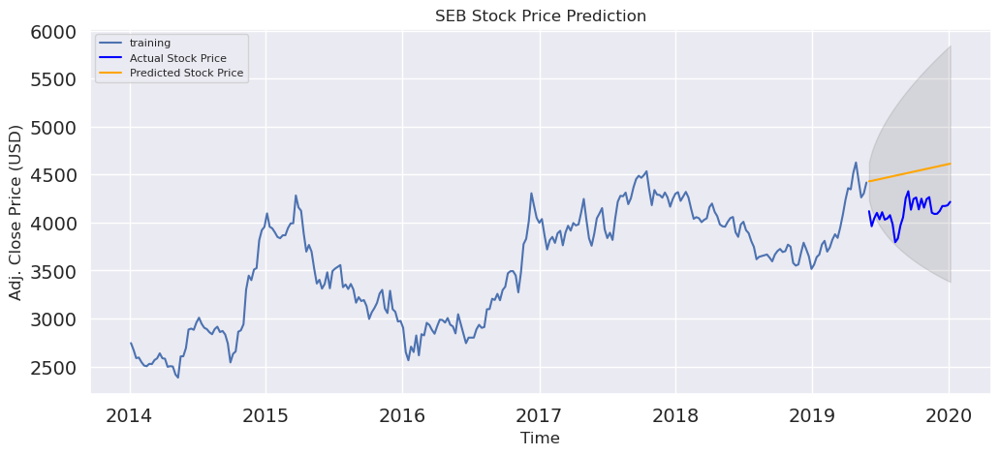

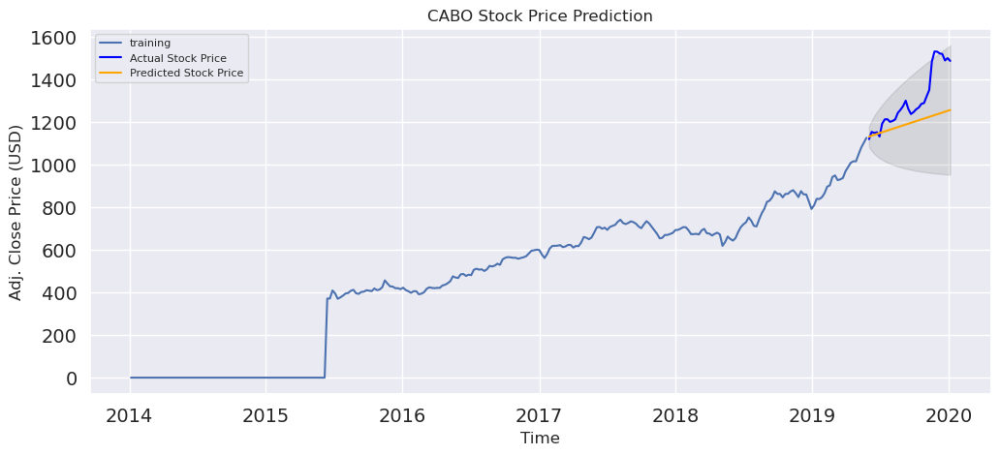

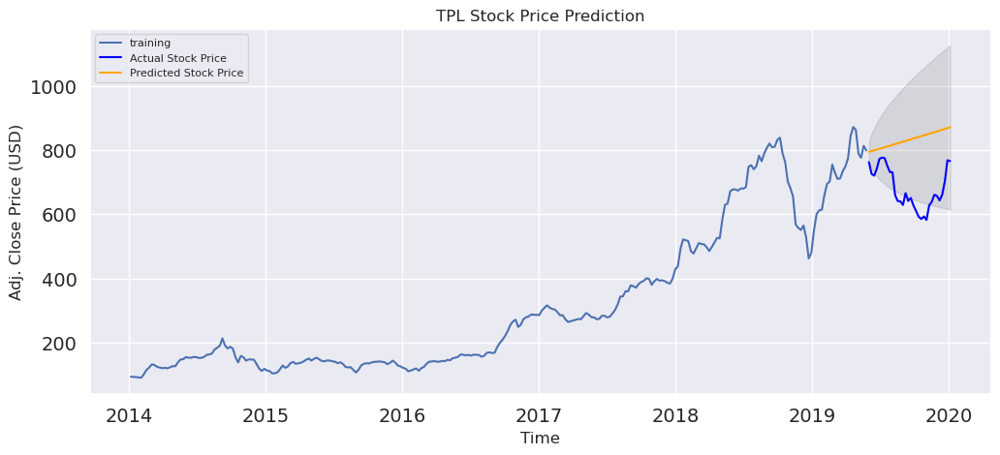

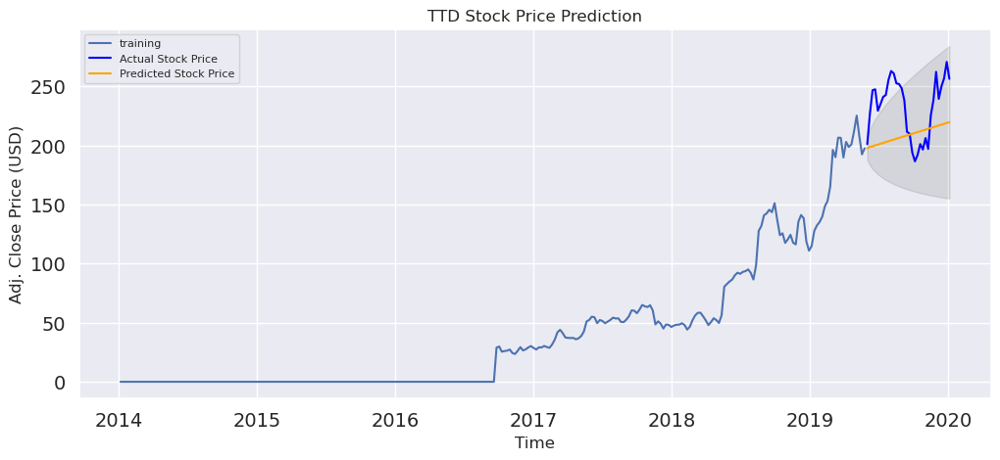

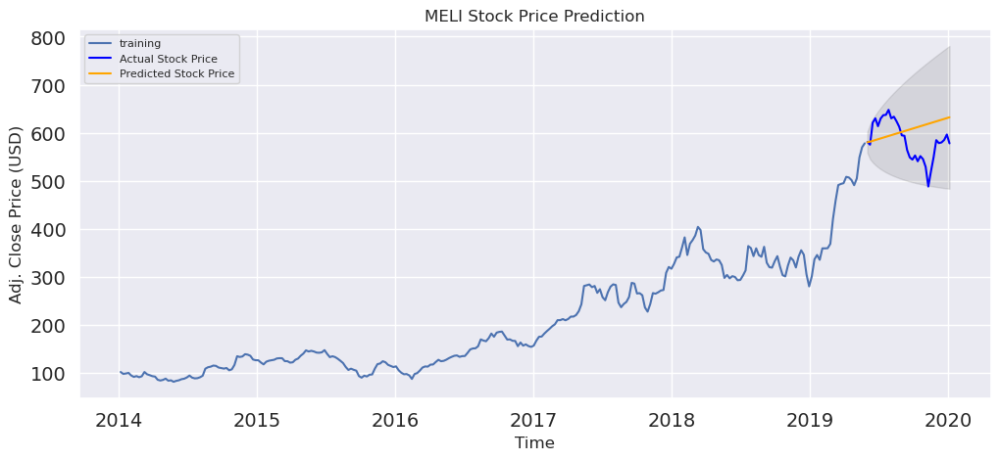

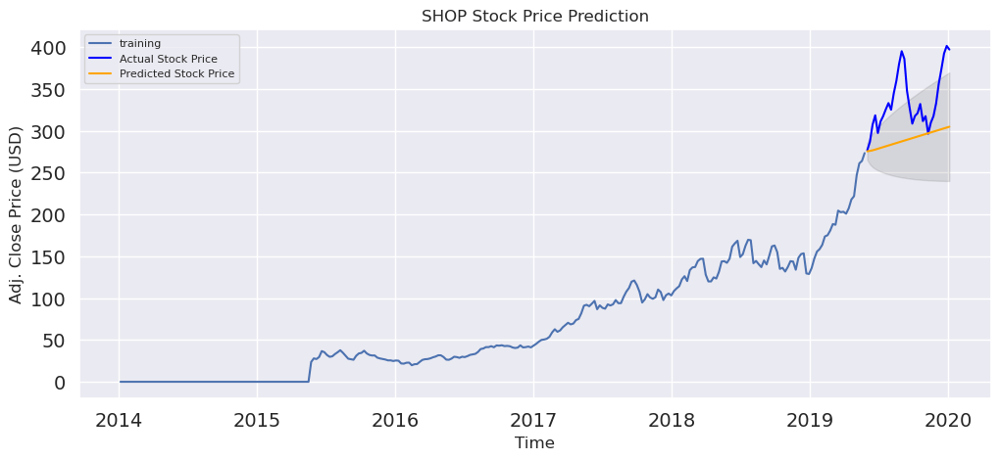

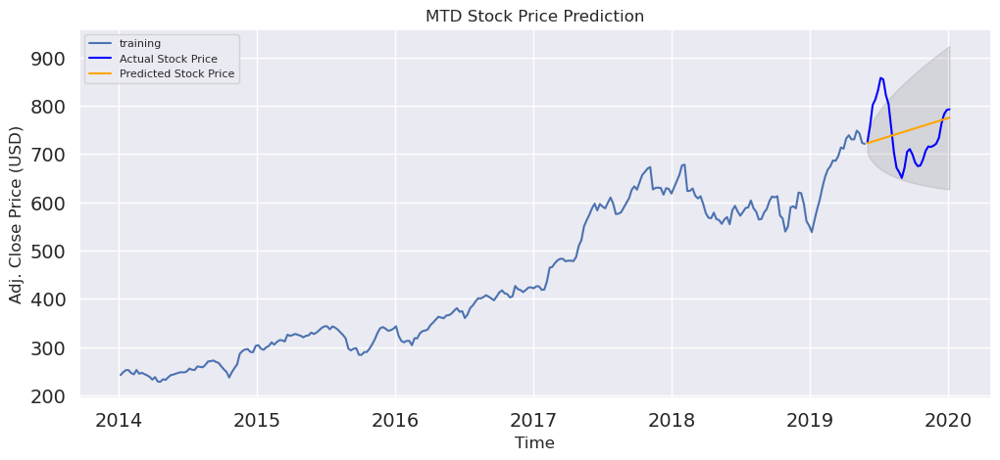

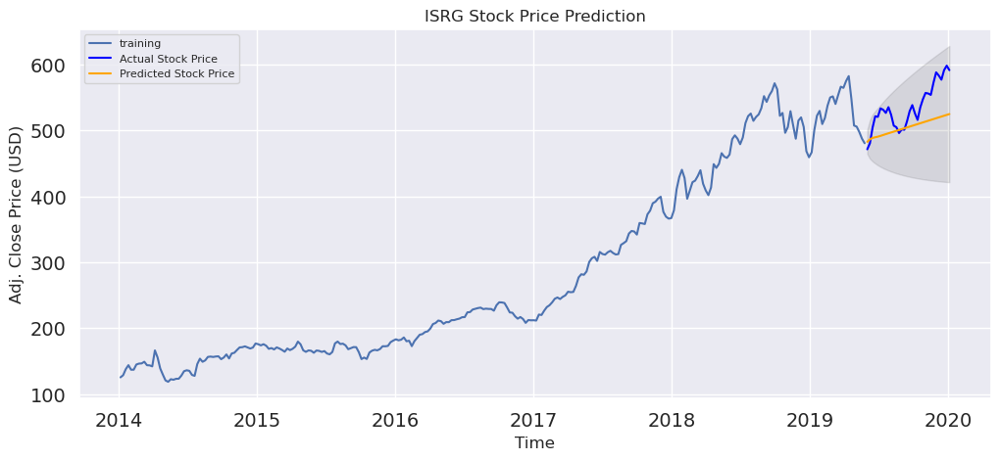

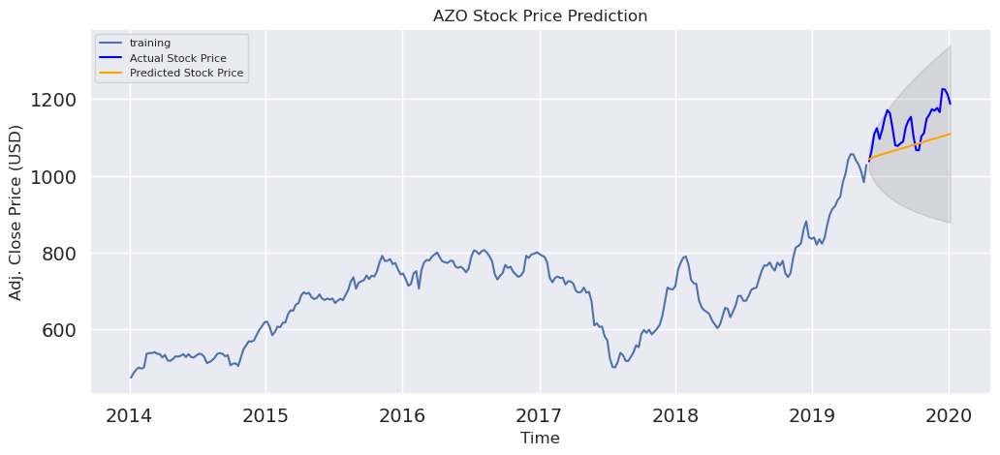

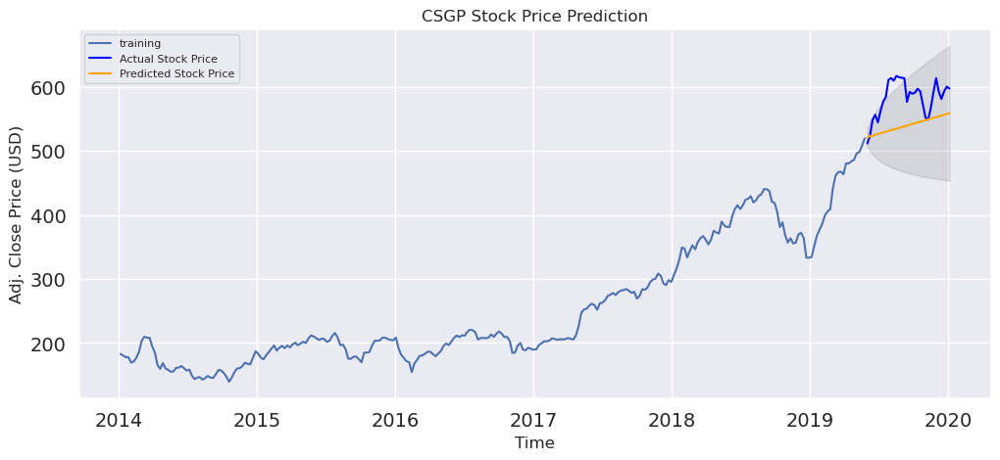

In [27]:
for ticker_symbol in top_10_performant_stock_symbols:
    df_stock = combined_df[[f'{ticker_symbol}_adj_close']]
    df_stock_wk = df_stock.resample("W").mean()
    df_stock_wk.fillna(0, inplace=True)
    
    forecast_one_year(df_stock_wk, ticker_symbol)

> We can see that for this preliminary study, our model does a pretty good jub at predicting the general trend of the close price as corroborated by the actual values.